In [ ]:
#https://www.kaggle.com/code/luukhofman/cnn-food-image-classification-pipeline

Create the dataset/ download them

I will follow https://www.kaggle.com/theimgclist/multiclass-food-classification-using-tensorflow to create the ML code

In [ ]:
! pip install -q kaggle


In [ ]:
from google.colab import drive
#drive.mount('/content/drive/')

In [ ]:
import requests, re, time
import torch, torchvision
from torch import nn, optim
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import os
import numpy as np



In [ ]:
import keras

import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D , Flatten
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import metrics

from sklearn.utils import class_weight
from collections import Counter

import matplotlib.pyplot as plt

from os import listdir
from os.path import isfile, join

import pandas as pd

The dataset is a kaggle dataset that holds 80 classes of indian food with 4000 images
> https://www.kaggle.com/datasets/iamsouravbanerjee/indian-food-images-dataset

In [ ]:


# Helper function to download data and extract
def get_data_extract():
  if "Indian Food Images" in os.listdir():
    print("Dataset already exists")
  else:
    print("Getting kaggle API token")
    !cp /content/drive/MyDrive/CPEN391_team_penguin/kaggle.json ~/.kaggle/kaggle.json
    print("Kaggle API token goten!")
    print("Downloading the data...")
    !kaggle datasets download -d iamsouravbanerjee/indian-food-images-dataset -p /content/
    print("Dataset downloaded!")
    print("Extracting data..")
    !unzip indian-food-images-dataset.zip
    print("Extraction done!")

    # Helper function to download data and extract
def get_data_extract2():
  if "themassiveindianfooddataset" in os.listdir():
    print("Dataset already exists")
  else:
    print("Getting kaggle API token")
    !cp /content/drive/MyDrive/CPEN391_team_penguin/kaggle.json ~/.kaggle/kaggle.json
    print("Kaggle API token goten!")
    print("Downloading the data...")
    !kaggle datasets download -d anshulmehtakaggl/themassiveindianfooddataset -p /content/
    print("Dataset downloaded!")
    print("Extracting data..")
    !unzip themassiveindianfooddataset.zip
    print("Extraction done!")



In [ ]:
get_data_extract()
get_data_extract()

Getting kaggle API token
cp: cannot create regular file '/root/.kaggle/kaggle.json': No such file or directory
Kaggle API token goten!
Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
Dataset downloaded!
Extracting data..
unzip:  cannot find or open indian-food-images-dataset.zip, indian-food-images-dataset.zip.zip or indian-food-images-dataset.zip.ZIP.
Extraction done!
Getting kaggle API token
Kaggle API token goten!
 99% 352M/355M [00:02<00:00, 148MB/s]
100% 355M/355M [00:02<00:00, 144MB/s]
Dataset downloaded!
Extracting data..
Archive:  indian-food-im

In [ ]:
#get_data_extract2()
#get_data_extract2()

In [ ]:
dataset_full_loc = 'Indian Food Images/Indian Food Images'
os.listdir(dataset_full_loc)

['misi_roti',
 'paneer_butter_masala',
 'aloo_methi',
 'phirni',
 'basundi',
 'maach_jhol',
 'gulab_jamun',
 'unni_appam',
 'sohan_halwa',
 'chicken_tikka_masala',
 'poha',
 'sheera',
 'anarsa',
 'bhindi_masala',
 'jalebi',
 'butter_chicken',
 'cham_cham',
 'adhirasam',
 'sohan_papdi',
 'bhatura',
 'doodhpak',
 'kofta',
 'imarti',
 'ras_malai',
 'sheer_korma',
 'aloo_gobi',
 'malapua',
 'mysore_pak',
 'kuzhi_paniyaram',
 'gajar_ka_halwa',
 'dharwad_pedha',
 'pithe',
 'makki_di_roti_sarson_da_saag',
 'chapati',
 'boondi',
 'bandar_laddu',
 'dal_tadka',
 'lassi',
 'lyangcha',
 'gavvalu',
 'daal_baati_churma',
 'dal_makhani',
 'biryani',
 'sutar_feni',
 'daal_puri',
 'kadhi_pakoda',
 'shankarpali',
 'ariselu',
 'kachori',
 'karela_bharta',
 'kajjikaya',
 'qubani_ka_meetha',
 'double_ka_meetha',
 'modak',
 'pootharekulu',
 'kakinada_khaja',
 'ghevar',
 'chak_hao_kheer',
 'chana_masala',
 'poornalu',
 'kalakand',
 'ledikeni',
 'palak_paneer',
 'chikki',
 'shrikhand',
 'chhena_kheeri',
 'chi

In [ ]:
# Visualize the data, showing one image per class from 80 classes
def visualize_classes():
    rows = 10
    cols = 8
    fig, ax = plt.subplots(rows, cols, figsize=(25,25))
    fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
    data_dir = dataset_full_loc
    foods_sorted = sorted(os.listdir(data_dir))
    food_id = 0
    for i in range(rows):
        for j in range(cols):
            try:
                food_selected = foods_sorted[food_id] 
                food_id += 1
            except:
                break
            if food_selected == '.DS_Store':
                continue
            food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
            food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
            img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
            ax[i][j].imshow(img)
            ax[i][j].set_title(food_selected, pad = 10)
        
    plt.setp(ax, xticks=[],yticks=[])
    #plt.savefig('/content/drive/MyDrive/CPEN391_team_penguin/random_img_classes.svg', format='svg', dpi=1200)
    plt.tight_layout()

    # https://matplotlib.org/users/tight_layout_guide.html

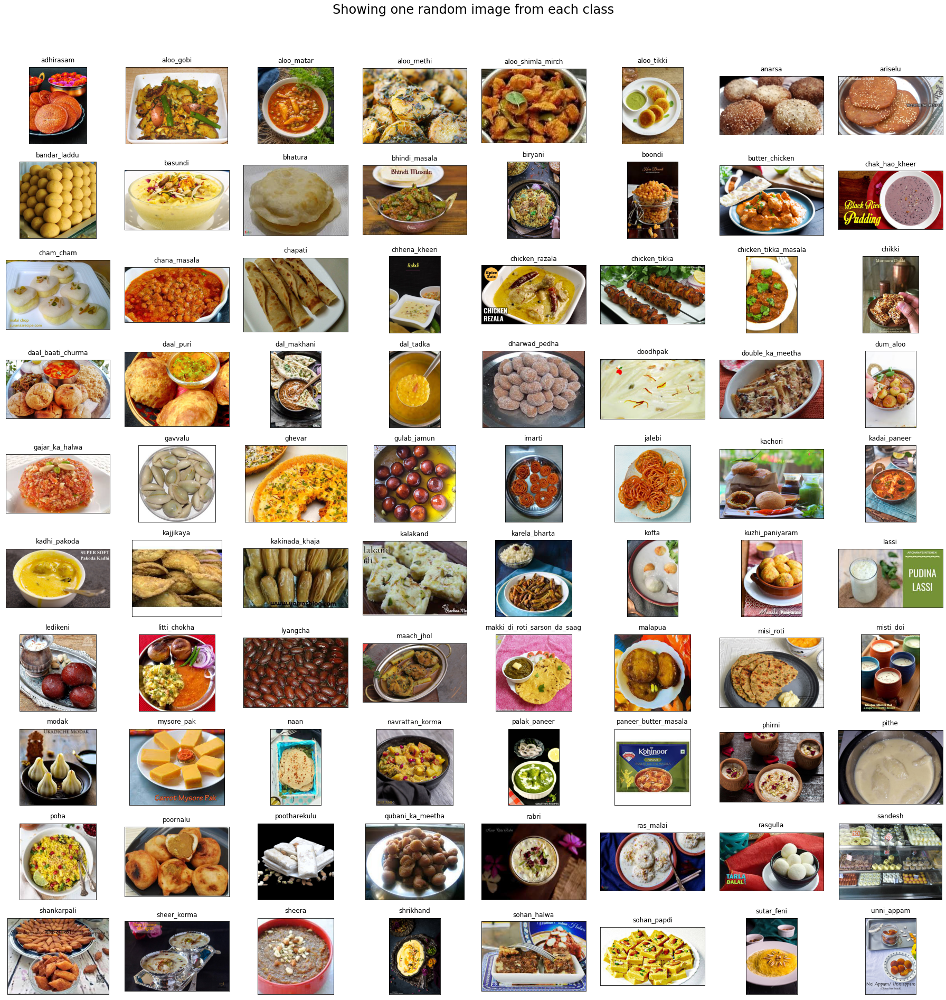

In [ ]:
visualize_classes()

I used imagedatagenerator from keras to split my dataset from traning to testing. I also used keras features to augment my data

In [ ]:
# Preprocessing settings for training data
train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale = 1./255,
    rotation_range=360,
    height_shift_range=0.2,
    width_shift_range=0.2,
    shear_range=0.01,
    zoom_range=[0.9, 1.25],
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='reflect',
    validation_split = 0.2)



In [ ]:
# Apply data transfers and create generators for training and test data
train_generator = train_datagen.flow_from_directory(
        directory=dataset_full_loc,
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset='training')

validation_generator = train_datagen.flow_from_directory(
        directory=dataset_full_loc,
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset='validation')

Found 3200 images belonging to 80 classes.
Found 800 images belonging to 80 classes.


In [ ]:
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
labels
import json

# as requested in comment


with open('classes.json', 'w') as file:
     file.write(json.dumps(labels)) # use `json.loads` to do the reverse


I use a pretrained InceptionV3 model.
The following layer modification are done following #https://www.kaggle.com/code/luukhofman/cnn-food-image-classification-pipeline .
The author showed decent results following these layers so followed them.

In [ ]:
# Cell below is used to initiate a cnn network

# Specify the shape of inputs
input_shape = (256,256,3)
batch_size = 32
n_classes = 80

# Set up model
base_model = InceptionV3(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=input_shape))
x = base_model.output
x = keras.layers.AveragePooling2D(pool_size=(6, 6))(x)
x = keras.layers.Dropout(.4)(x)
x = keras.layers.Flatten()(x)
predictions = keras.layers.Dense(n_classes,  kernel_initializer='glorot_uniform', kernel_regularizer=keras.regularizers.L2(.0005), activation='softmax', name='predictions')(x)
model = Model(inputs=base_model.input, outputs=predictions)
# Display model
#model.summary()

87924736/87910968 [==============================] - 3s 0us/step


In [ ]:
# Show if GPU is avialable
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


The model uses Adam optimizer with the default learning rate. Adam is used since adam relies less on hyperparameters and it converges faster.

In [ ]:
# Initaite mode, specify the optimizer, lossfunction and metrics
opt = tf.keras.optimizers.Adam()

model.compile(optimizer = opt,
              loss ='categorical_crossentropy',
              metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=5)])

# Save weights if model improved
filepath = "weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='auto')

# Early stopping in case val_loss < min_delta for a specific number of runs 
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.1, patience=20, verbose=1, mode='auto', baseline=None, restore_best_weights=False)

# Set callbacks 
callbacks_list = [checkpoint, early_stopping]

# same model as whole
model.save("Inception_transfer_10epocs.h5")



In [ ]:
# Fit data & train model
hist = model.fit(
        train_generator,
        steps_per_epoch = train_generator.samples // batch_size,
        callbacks = callbacks_list,
        epochs = 100,
        validation_data = validation_generator,
        validation_steps = validation_generator.samples // batch_size)

Epoch 1/100
100/100 [==============================] - ETA: 0s - loss: 4.2547 - accuracy: 0.0469 - top_k_categorical_accuracy: 0.1903
Epoch 1: val_accuracy improved from -inf to 0.04125, saving model to weights-improvement-01-0.04.hdf5
100/100 [==============================] - 160s 1s/step - loss: 4.2547 - accuracy: 0.0469 - top_k_categorical_accuracy: 0.1903 - val_loss: 4.5776 - val_accuracy: 0.0413 - val_top_k_categorical_accuracy: 0.1575
Epoch 2/100
100/100 [==============================] - ETA: 0s - loss: 3.5645 - accuracy: 0.1272 - top_k_categorical_accuracy: 0.4103
Epoch 2: val_accuracy improved from 0.04125 to 0.08250, saving model to weights-improvement-02-0.08.hdf5
100/100 [==============================] - 134s 1s/step - loss: 3.5645 - accuracy: 0.1272 - top_k_categorical_accuracy: 0.4103 - val_loss: 5.5684 - val_accuracy: 0.0825 - val_top_k_categorical_accuracy: 0.2725
Epoch 3/100
100/100 [==============================] - ETA: 0s - loss: 3.1356 - accuracy: 0.2078 - top_k_

As shown in the plots below the Top 5 categorical accuracy is 80% which is decent for a 80 class food model.

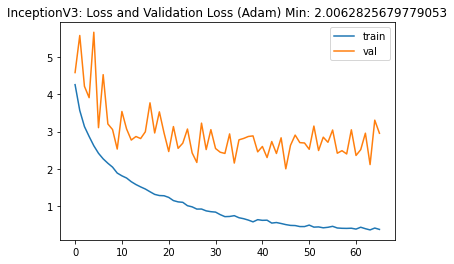

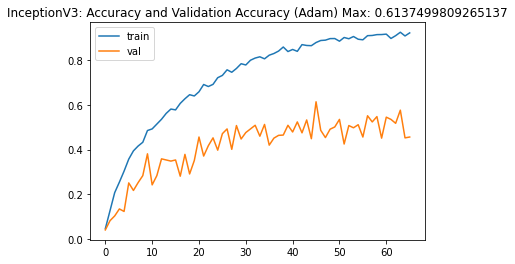

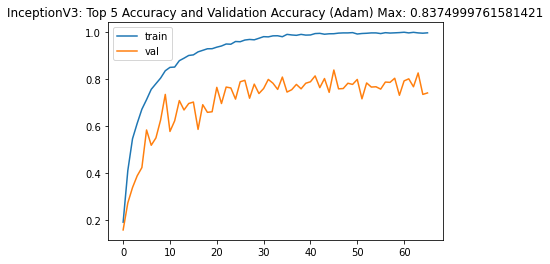

In [ ]:


plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='val')
plt.title(f"InceptionV3: Loss and Validation Loss (Adam) Min: {min(hist.history['val_loss'])}")
plt.legend();
plt.savefig('/content/drive/MyDrive/CPEN391_team_penguin/loss.png')
plt.show()

plt.plot(hist.history['accuracy'], label='train')
plt.plot(hist.history['val_accuracy'], label='val')
plt.title(f"InceptionV3: Accuracy and Validation Accuracy (Adam) Max: {max(hist.history['val_accuracy'])}")
plt.legend();
plt.savefig('/content/drive/MyDrive/CPEN391_team_penguin/accuracy.png')
plt.show()

plt.plot(hist.history['top_k_categorical_accuracy'], label='train')
plt.plot(hist.history['val_top_k_categorical_accuracy'], label='val')
plt.title(f"InceptionV3: Top 5 Accuracy and Validation Accuracy (Adam) Max: {max(hist.history['val_top_k_categorical_accuracy'])}")
plt.legend();
plt.savefig('/content/drive/MyDrive/CPEN391_team_penguin/top_5_accuracy.png')
plt.show()


In [ ]:
max_acc = max(hist.history['val_accuracy'])
max_acc

0.6137499809265137

In [ ]:
model.save(f'/content/drive/MyDrive/CPEN391_team_penguin/Model/InceptionV3/save{max_acc}acc')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/CPEN391_team_penguin/Model/InceptionV3/save0.6137499809265137acc/assets


In [ ]:
# Predict & submit 
# Uncomment to load previous model
# model = tf.keras.models.load_model('/kaggle/input/ml-model-v2/whole_model_v4.h5')

test_directory = '/content/drive/MyDrive/food indian_food test'

# Test data generator -> Rescale image size
test_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale = 1./255)

# apply test_datagen to input files
test_generator = test_datagen.flow_from_directory(
        directory=test_directory,
        target_size=(256, 256),
        shuffle = False,
        class_mode=None,
        batch_size=1)

# Get the filenames & remove directory specification in front of filename
filenames = [filename for filename in test_generator.filenames]

# Not predicting in batches but each inidividual item, therefore we need to know the amount of predictions
nb_samples = len(filenames)



Found 58 images belonging to 2 classes.


In [ ]:

# Make predictions, returns probabilities for each class
print(f'Making predictions....')
model_loc = "/content/drive/MyDrive/CPEN391_team_penguin/Model/InceptionV3/save0.6137499809265137acc"
model = keras.models.load_model(model_loc)
model_predictions = model.predict(test_generator,steps = nb_samples, verbose=1)


Making predictions....
58/58 [==============================] - 11s 173ms/step


In [ ]:
# Assign prediction to class with highest probability
y_pred_labels = np.argmax(model_predictions, axis = 1)

# Map predictions to the correct labels
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
print(labels)
predictions = [labels[k] for k in y_pred_labels]

#print(predictions)

# Submit file
submission = pd.DataFrame({'img_name':filenames,'label':predictions})
submission.to_csv('submission.csv', index=False)
print("Done!")

{0: 'adhirasam', 1: 'aloo_gobi', 2: 'aloo_matar', 3: 'aloo_methi', 4: 'aloo_shimla_mirch', 5: 'aloo_tikki', 6: 'anarsa', 7: 'ariselu', 8: 'bandar_laddu', 9: 'basundi', 10: 'bhatura', 11: 'bhindi_masala', 12: 'biryani', 13: 'boondi', 14: 'butter_chicken', 15: 'chak_hao_kheer', 16: 'cham_cham', 17: 'chana_masala', 18: 'chapati', 19: 'chhena_kheeri', 20: 'chicken_razala', 21: 'chicken_tikka', 22: 'chicken_tikka_masala', 23: 'chikki', 24: 'daal_baati_churma', 25: 'daal_puri', 26: 'dal_makhani', 27: 'dal_tadka', 28: 'dharwad_pedha', 29: 'doodhpak', 30: 'double_ka_meetha', 31: 'dum_aloo', 32: 'gajar_ka_halwa', 33: 'gavvalu', 34: 'ghevar', 35: 'gulab_jamun', 36: 'imarti', 37: 'jalebi', 38: 'kachori', 39: 'kadai_paneer', 40: 'kadhi_pakoda', 41: 'kajjikaya', 42: 'kakinada_khaja', 43: 'kalakand', 44: 'karela_bharta', 45: 'kofta', 46: 'kuzhi_paniyaram', 47: 'lassi', 48: 'ledikeni', 49: 'litti_chokha', 50: 'lyangcha', 51: 'maach_jhol', 52: 'makki_di_roti_sarson_da_saag', 53: 'malapua', 54: 'misi_r

As you can see below the model classifies unique food like soan papdi correctly, but rice curry combinations are a struggle

58


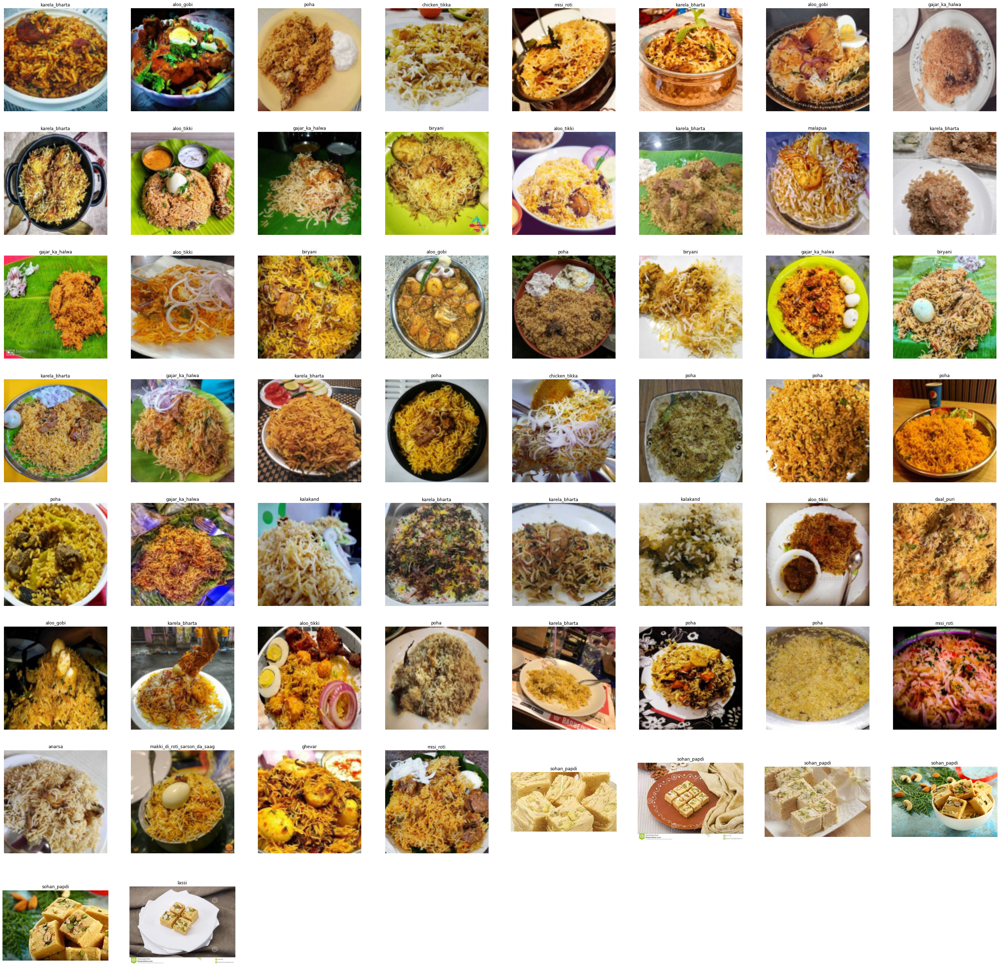

In [ ]:
#import libraries
import cv2
from matplotlib import pyplot as plt

filename = 'submission.csv'
counter = 0
with open(filename, 'r') as csvfile: 
    figures = [(i[0],i[1]) for i in csv.reader(csvfile) if i[0] != 'img_name']    

# create figure
fig = plt.figure(figsize=(50, 50))
  
# setting values to rows and column variables
rows = 8
columns = 8
print(len(figures))  
# reading images
for ind, (filename,title) in enumerate(figures):

    path = f"{test_directory}/{filename}"
    Image1 = plt.imread(path)
  
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, ind+1)
    
    # showing image
    plt.imshow(Image1)
    plt.axis('off')
    plt.title(title)
